In [1]:
import funcs
import mrsobs

import itertools
import numpy as np
from astropy.io import fits
from scipy.interpolate import interp1d
from scipy.ndimage import gaussian_filter1d

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
%matplotlib notebook

In [2]:
%autosave 30

Autosaving every 30 seconds


In [3]:
workDir  = '/Users/ioannisa/Desktop/python/miri_devel/'
d2cMapDir = workDir+'notebooks/distortionMaps/'
lvl1path = '/STER/miriman/FM/'

In [4]:
# select band
band = '4B'

# The non-linearity correction is described by a n-th order polynomial, define the order here, as well as the integration ramp to be used
order = 4
analyze_ramp = 1

# define frames in ramp to skip
skip_first = 3
skip_last  = 1

In [ ]:
# FM MRS_RAD_03 (MRS high background)
filename = mrsobs.MIRI_high_background(lvl1path,band,output='filename').replace('_LVL2','')

image_hdu = fits.open(filename)
image_data = fits.getdata(filename)[:,:1024,:].astype('float')

In [8]:
image_shape = image_data.shape
nints       = image_hdu[0].header['NINT']
ngroups     = image_hdu[0].header['NGROUP']
nframes     = image_shape[0]
readout     = image_hdu[0].header['READOUT']
frame_delta_time = image_hdu[0].header['TFRAME']
print('Number of integrations: {}'.format(nints))
print('Number of groups/frames per integration: {}'.format(ngroups))
print('Total number of frames: {}'.format(nframes))
print('Readout: {}'.format(readout))
print('Time between samples: {} sec'.format(frame_delta_time))
print('LVL1 data shape: {}'.format(image_shape))

Number of integrations: 2
Number of groups/frames per integration: 200
Total number of frames: 400
Readout: FAST
Time between samples: 2.77504 sec
LVL1 data shape: (400, 1024, 1032)


<IPython.core.display.Javascript object>


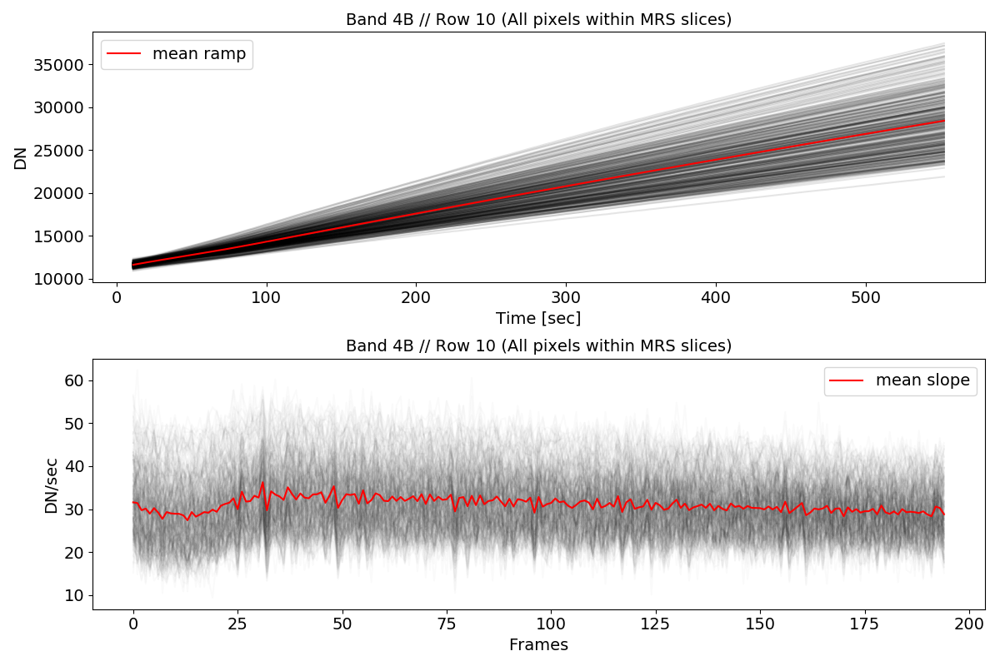

In [9]:
plt.close('all')

if band[0] in ['1','4']:
    range_x = range(10,512)
elif band[0] in ['2','3']:
    range_x = range(512,1020)

time  = np.arange(1,nframes+1)[(analyze_ramp-1)*ngroups:analyze_ramp*ngroups]*frame_delta_time
ramp_arr,slope_arr = [],[]
d2cMaps   = funcs.load_obj('d2cMaps_band{}_tr90pc'.format(band),path=d2cMapDir)
valid_img = np.zeros(d2cMaps['sliceMap'].shape)
valid_img[d2cMaps['sliceMap']!=0] = 1

fig,axs = plt.subplots(2,1,figsize=(12,8))
for ypos in [10]:
    for xpos in range_x:
        if valid_img[ypos,xpos] == 1:
            tramp = image_data[(analyze_ramp-1)*ngroups:analyze_ramp*ngroups,ypos,xpos]
            time2,tramp2 = time[skip_first:-skip_last],tramp[skip_first:-skip_last]
            time3,tramp3 = time2[tramp2 < 58000],tramp2[tramp2 < 58000]
            ramp_arr.append(tramp3)
            slope_arr.append(np.diff(tramp3)/frame_delta_time)
            
            axs[0].plot(time3,tramp3,'k',alpha=0.1)
            axs[1].plot(np.diff(tramp3)/frame_delta_time,'k',alpha=0.02)
ramp_arr = np.array(ramp_arr)
slope_arr = np.array(slope_arr)
axs[0].plot(time3,np.mean(ramp_arr,axis=0),'r',label='mean ramp')
axs[1].plot(np.mean(slope_arr,axis=0),'r',label='mean slope')
axs[0].set_xlabel('Time [sec]',fontsize=14)
axs[0].set_ylabel('DN',fontsize=14)
axs[1].set_xlabel('Frames',fontsize=14)
axs[1].set_ylabel('DN/sec',fontsize=14)
for plot in range(2):
    axs[plot].legend(fontsize=14)
    axs[plot].set_title('Band {} // Row {} (All pixels within MRS slices)'.format(band,ypos),fontsize=14)
    axs[plot].tick_params(axis='both',labelsize=14)
plt.tight_layout()

<IPython.core.display.Javascript object>


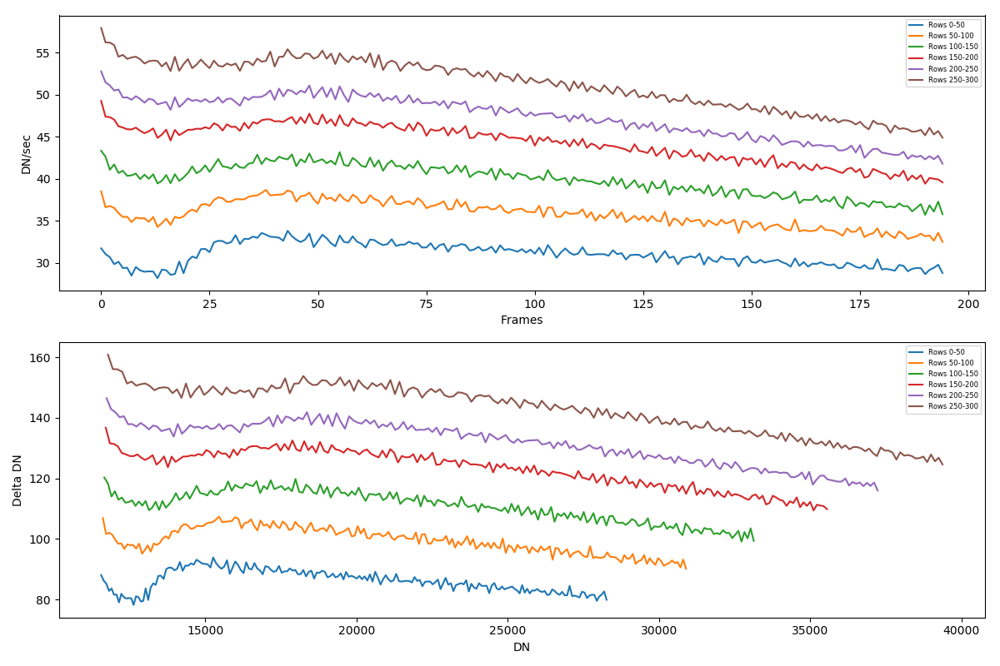

In [12]:
plt.close('all')

if band[0] in ['1','4']:
    range_x = range(10,512)
elif band[0] in ['2','3']:
    range_x = range(512,1020)

# plt.figure(figsize=(12,4))
# for ypos in [10]:
#     for xpos in range_x:
#         time  = np.arange(1,nframes+1)[(analyze_ramp-1)*ngroups:analyze_ramp*ngroups]*frame_delta_time
#         tramp = image_data[(analyze_ramp-1)*ngroups:analyze_ramp*ngroups,ypos,xpos]
#         time2,tramp2 = time[skip_first:-skip_last],tramp[skip_first:-skip_last]
#         time3,tramp3 = time2[tramp2 < 58000],tramp2[tramp2 < 58000]
#         plt.plot(time3,tramp3,'k',alpha=0.1)
# plt.xlabel('Time [sec]')
# plt.ylabel('DN')
# plt.tight_layout()

time  = np.arange(1,nframes+1)[(analyze_ramp-1)*ngroups:analyze_ramp*ngroups]*frame_delta_time
reduced_time = time[skip_first:-skip_last]
d2cMaps   = funcs.load_obj('d2cMaps_band{}_tr90pc'.format(band),path=d2cMapDir)
valid_img = np.zeros(d2cMaps['sliceMap'].shape)
valid_img[d2cMaps['sliceMap']!=0] = 1

step = 50
fig,axs = plt.subplots(2,1,figsize=(12,8))
for i in range(1024/step):
    ramp_arr = []
    for ypos in range(i*step,(i+1)*step):
        for xpos in range_x:
            if valid_img[ypos,xpos] == 1:
                tramp = image_data[(analyze_ramp-1)*ngroups:analyze_ramp*ngroups,ypos,xpos]
                tramp[np.isnan(tramp)] = 0
                time2,tramp2 = time[skip_first:-skip_last],tramp[skip_first:-skip_last]
                time3,tramp3 = time2[tramp2 < 58000],tramp2[tramp2 < 58000]
                ramp_arr.append(tramp3)
    ramp_arr = np.array(ramp_arr)
    
    try:
        axs[0].plot(np.diff(np.mean(ramp_arr,axis=0))/frame_delta_time,label='Rows {}-{}'.format(i*step,(i+1)*step))
        axs[1].plot(np.mean(ramp_arr,axis=0)[:-1],np.mean(np.diff(ramp_arr),axis=0),label='Rows {}-{}'.format(i*step,(i+1)*step))
    except:
        pass
axs[0].set_xlabel('Frames')
axs[0].set_ylabel('DN/sec')
axs[1].set_xlabel('DN')
axs[1].set_ylabel('Delta DN')
axs[0].legend(loc='upper right',fontsize=6)
axs[1].legend(fontsize=6)
plt.tight_layout()

In [48]:
# initialize placeholders
out_parameters = np.zeros(shape =(order + 1, image_shape[1], image_shape[2] ), dtype=np.float64)
count_rate_at_0DN = np.zeros(shape =(image_shape[1], image_shape[2] ), dtype=np.float64)

print('Output parameters (object shape): {}'.format(out_parameters.shape))
print('Count rate at 0DN (object shape): {}'.format(count_rate_at_0DN.shape))

Output parameters (object shape): (5, 1024, 1032)
Count rate at 0DN (object shape): (1024, 1032)


## Derive non-linearity correction for a single pixel

<IPython.core.display.Javascript object>


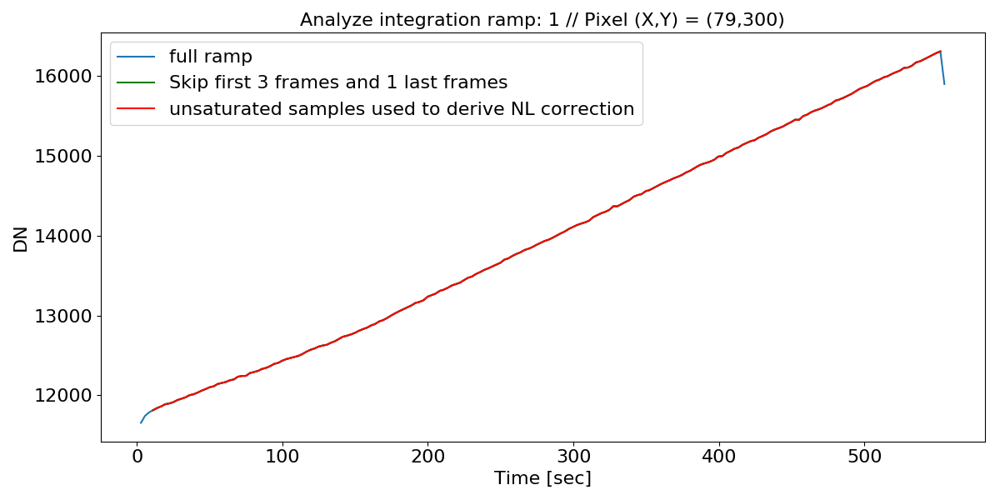

In [60]:
# Define ramp to be used for derivation of non-linearity correction
d2cMaps   = funcs.load_obj('d2cMaps_band{}_tr90pc'.format(band),path=d2cMapDir)
trace_y,trace_x = funcs.detpixel_trace(band,d2cMaps,sliceID=d2cMaps['nslices']/2,alpha_pos=0.)

row = 300
ypos,xpos = trace_y[row],trace_x[row]

time  = np.arange(1,nframes+1)[(analyze_ramp-1)*ngroups:analyze_ramp*ngroups]*frame_delta_time
tramp = image_data[(analyze_ramp-1)*ngroups:analyze_ramp*ngroups,ypos,xpos]
time2,tramp2 = time[skip_first:-skip_last],tramp[skip_first:-skip_last]
time3,tramp3 = time2[tramp2 < 58000],tramp2[tramp2 < 58000]

plt.figure(figsize=(12,6))
plt.plot(time,tramp,label='full ramp')
plt.plot(time2,tramp2,'g',label='Skip first {} frames and {} last frames'.format(skip_first,skip_last))
plt.plot(time3,tramp3,'r',label='unsaturated samples used to derive NL correction')
plt.xlabel('Time [sec]',fontsize=16)
plt.ylabel('DN',fontsize=16)
plt.legend(fontsize=16)
plt.title('Analyze integration ramp: {} // Pixel (X,Y) = ({},{})'.format(analyze_ramp,xpos,ypos),fontsize=16)
plt.tick_params(axis='both',labelsize=16)
plt.tight_layout()

<IPython.core.display.Javascript object>


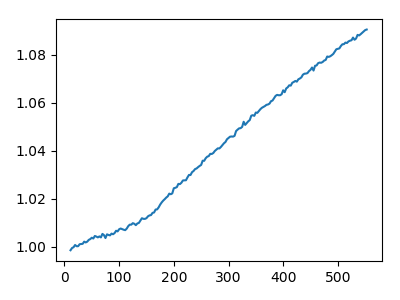

<IPython.core.display.Javascript object>


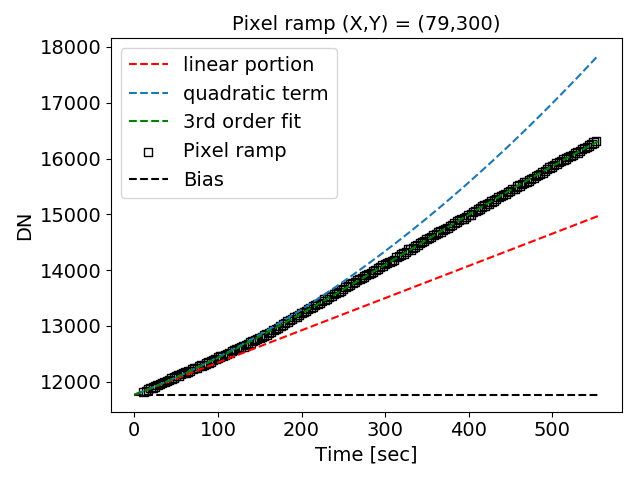

<IPython.core.display.Javascript object>


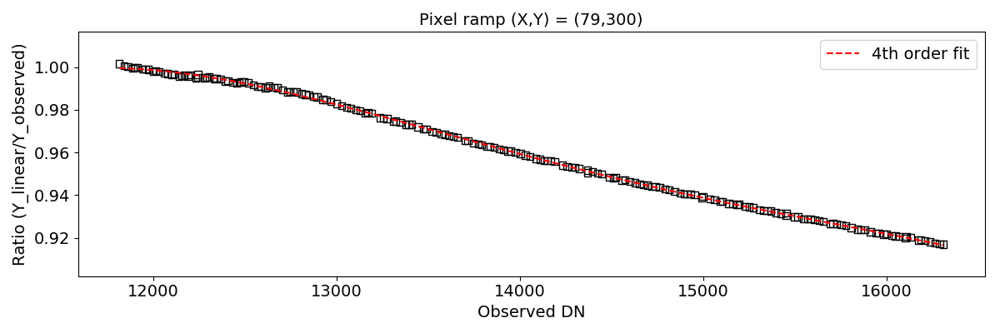

In [61]:
# derive non-linearity correction
intime = time3
inramp = tramp3

num_samples = inramp.size
first_fit_order = 3
assert num_samples > order + 3, 'Not enough samples to derive a non-linearity correction'

if first_fit_order == 2:
    bias,linear_term,quad_term = np.polynomial.polynomial.polyfit(intime, inramp, first_fit_order)
elif first_fit_order == 3:
    bias,linear_term,quad_term,cubic_term = np.polynomial.polynomial.polyfit(intime, inramp, first_fit_order)
elif first_fit_order == 4:
    bias,linear_term,quad_term,cubic_term,fourth_order_term = np.polynomial.polynomial.polyfit(intime, inramp, first_fit_order)

expected_rate = linear_term
expected_DN = bias+linear_term*intime

plt.figure(figsize=(4,3))
plt.plot(intime,inramp/expected_DN)
plt.tight_layout()

time_array = np.arange(skip_first+len(inramp)+skip_last+1)*frame_delta_time
plt.figure()
plt.scatter(intime,inramp,marker='s',facecolors='none',edgecolors='k',label='Pixel ramp')
# plt.plot(intime,expected_rate * (intime-intime[0]) + inramp[0],label='Expected DN as defined by Mike Regan')
plt.hlines(bias,0,time[-1],'k',linestyle='dashed',label='Bias')
plt.plot(time_array,bias+linear_term*time_array,'r',label='linear portion',linestyle='dashed')
plt.plot(time,bias+linear_term*time+quad_term*time**2,label='quadratic term',linestyle='dashed')
if first_fit_order == 3:
    plt.plot(time_array,bias+linear_term*time_array+quad_term*time_array**2+cubic_term*time_array**3,'g',label='3rd order fit',linestyle='dashed')
elif first_fit_order == 4:
    plt.plot(time_array,bias+linear_term*time_array+quad_term*time_array**2+cubic_term*time_array**3+fourth_order_term*time_array**4,'g',label='4th order fit',linestyle='dashed')
plt.xlabel('Time [sec]',fontsize=14)
plt.ylabel('DN',fontsize=14)
plt.legend(fontsize=14)
plt.title('Pixel ramp (X,Y) = ({},{})'.format(xpos,ypos),fontsize=14)
plt.tick_params(axis='both',labelsize=14)
plt.tight_layout()

# now get the ratio between the expected DN and the actual DN. 
# This is the correction factor.
correction_factor = expected_DN/inramp
assert np.sum(np.isfinite(correction_factor)) == correction_factor.size, 'There are non legal values in the correction factor array'

#solve for the correction factor as a function of observed DN.
coefs = np.polynomial.polynomial.polyfit(inramp, correction_factor, order)
poly = np.poly1d(coefs[::-1])

ramp = np.linspace(inramp[0],inramp[-1],1000)
plt.figure(figsize=(12,4))
# plt.plot(ramp,poly(ramp))
plt.scatter(inramp,correction_factor,marker='s',facecolors='none',edgecolors='k')
# plt.hlines(coefs[0],0,inramp[-1],'k',linestyle='dashed',label='Bias')
plt.plot(ramp,coefs[0]+coefs[1]*ramp+coefs[2]*ramp**2+coefs[3]*ramp**3+coefs[4]*ramp**4,'r',label='4th order fit',linestyle='dashed')
plt.xlabel('Observed DN',fontsize=14)
plt.ylabel('Ratio (Y_linear/Y_observed)',fontsize=14)
plt.legend(fontsize=14)
plt.title('Pixel ramp (X,Y) = ({},{})'.format(xpos,ypos),fontsize=14)
plt.tick_params(axis='both',labelsize=14)
plt.tight_layout()

In [14]:
# insert results in placeholder array
out_parameters[:, ypos,xpos] = coefs
count_rate_at_0DN[ypos,xpos] = expected_rate

In [15]:
# apply correction
# define placeholders
out_ramp = np.zeros_like(inramp, dtype=np.float64)
new_rate = np.zeros(shape=(len(inramp)-1, image_shape[1], image_shape[2]), dtype=np.float64)

print('Output ramp (object shape): {}'.format(out_ramp.shape))
print('New rate (object shape): {}'.format(new_rate.shape))

Output ramp (object shape): (24,)
New rate (object shape): (23, 1024, 1032)


<IPython.core.display.Javascript object>


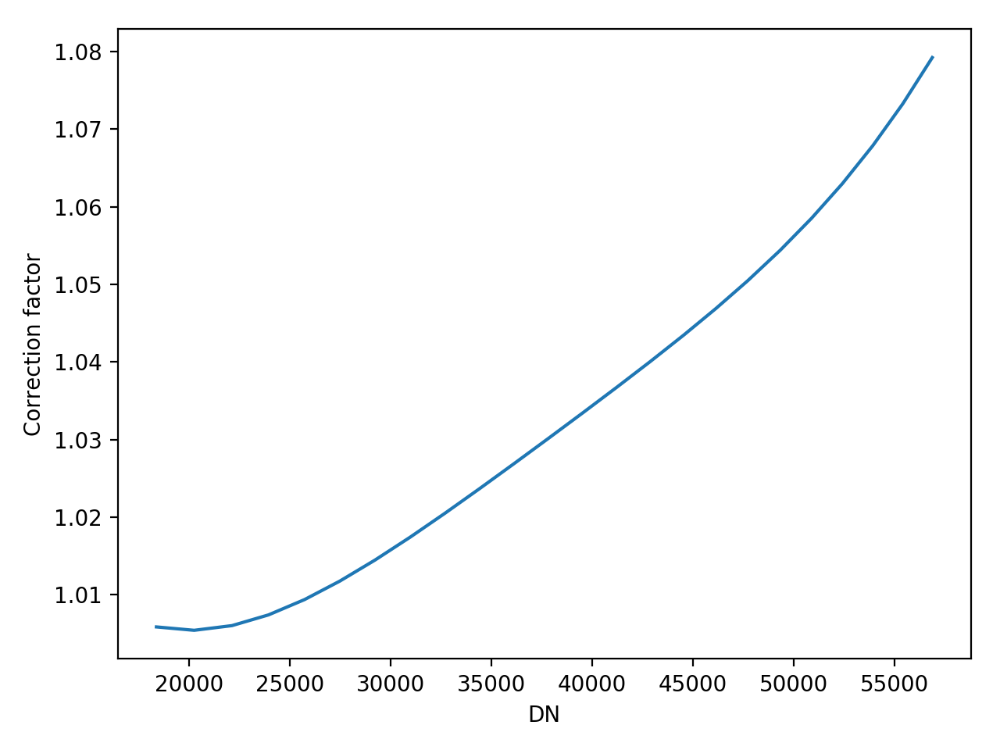

<IPython.core.display.Javascript object>


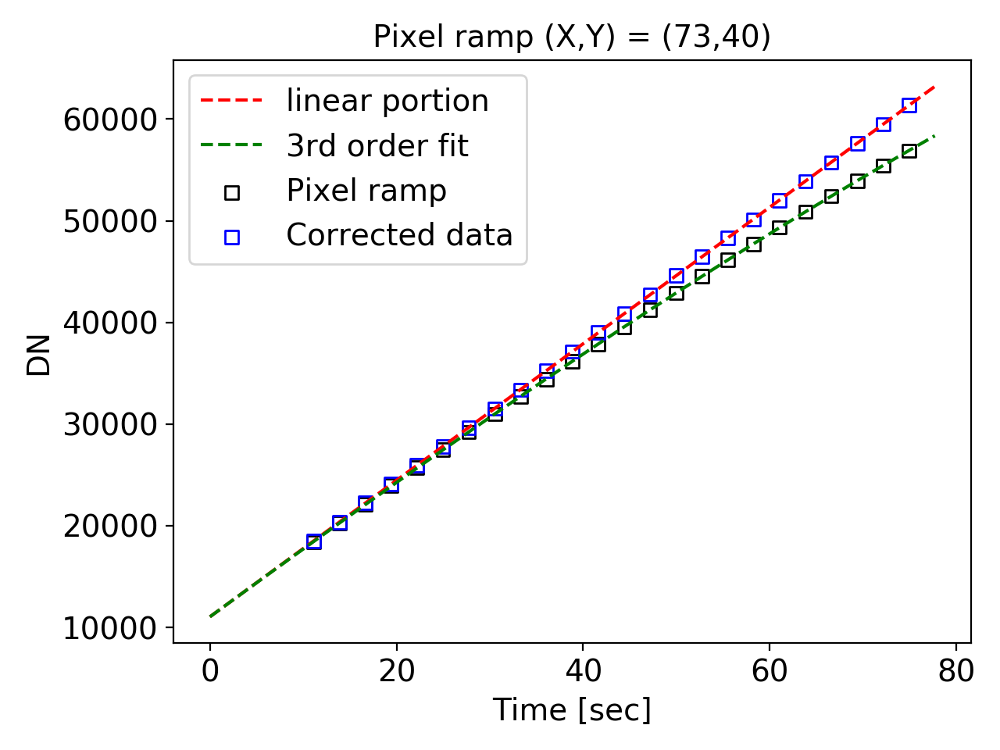

<IPython.core.display.Javascript object>


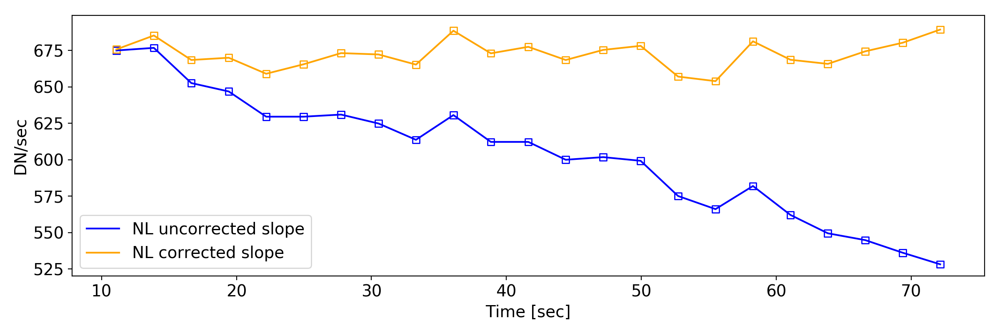

In [16]:
cor_factor = np.polynomial.polynomial.polyval(inramp, out_parameters[:, ypos, xpos])

plt.figure()
plt.plot(inramp,cor_factor)
plt.xlabel('DN')
plt.ylabel('Correction factor')
plt.tight_layout()

# correct ramp by applying derived NL correction
corrected_ramp = cor_factor * inramp

time_array = np.arange(skip_first+len(inramp)+skip_last+1)*frame_delta_time
plt.figure()
plt.scatter(intime,inramp,marker='s',facecolors='none',edgecolors='k',label='Pixel ramp')
plt.scatter(intime,corrected_ramp,marker='s',facecolors='none',edgecolors='b',label='Corrected data')
plt.plot(time_array,bias+linear_term*time_array,'r',label='linear portion',linestyle='dashed')
if first_fit_order == 3:
    plt.plot(time_array,bias+linear_term*time_array+quad_term*time_array**2+cubic_term*time_array**3,'g',label='3rd order fit',linestyle='dashed')
elif first_fit_order == 4:
    plt.plot(time_array,bias+linear_term*time_array+quad_term*time_array**2+cubic_term*time_array**3+fourth_order_term*time_array**4,'g',label='4th order fit',linestyle='dashed')
plt.xlabel('Time [sec]',fontsize=14)
plt.ylabel('DN',fontsize=14)
plt.legend(fontsize=14)
plt.title('Pixel ramp (X,Y) = ({},{})'.format(xpos,ypos),fontsize=14)
plt.tick_params(axis='both',labelsize=14)
plt.tight_layout()

new_rate_DN = np.diff(corrected_ramp)
new_rate[:, ypos, xpos] = new_rate_DN

plt.figure(figsize=(12,4))
plt.scatter(intime[:-1],np.diff(inramp)/frame_delta_time,marker='s',facecolors='none',edgecolors='b')
plt.plot(intime[:-1],np.diff(inramp)/frame_delta_time,'b',label='NL uncorrected slope')
plt.scatter(intime[:-1],new_rate_DN/frame_delta_time,marker='s',facecolors='none',edgecolors='orange')
plt.plot(intime[:-1],new_rate_DN/frame_delta_time,'orange',label='NL corrected slope')
plt.xlabel('Time [sec]',fontsize=14)
plt.ylabel('DN/sec',fontsize=14)
plt.legend(fontsize=14)
plt.tick_params(axis='both',labelsize=14)
plt.tight_layout()

## Derive non-linearity correction for a single trace in MRS slice

In [17]:
# initialize placeholders
bias_map,linear_term_map,quad_term_map,cubic_term_map = [np.zeros(shape =(image_shape[1], image_shape[2] ), dtype=np.float64) for i in range(4)]
out_parameters = np.zeros(shape =(order + 1, image_shape[1], image_shape[2] ), dtype=np.float64)
count_rate_at_0DN = np.zeros(shape =(image_shape[1], image_shape[2] ), dtype=np.float64)

d2cMaps = funcs.load_obj('d2cMaps_band{}_tr90pc'.format(band),path=d2cMapDir)
trace_y,trace_x = funcs.detpixel_trace(band,d2cMaps,sliceID=d2cMaps['nslices']/2,alpha_pos=0.)
for i in range(1024):
    if i%100 == 0:
        print 'Row {}'.format(i)
    ypos,xpos = trace_y[i],trace_x[i]
    time  = np.arange(1,nframes+1)[(analyze_ramp-1)*ngroups:analyze_ramp*ngroups]*frame_delta_time
    tramp = image_data[(analyze_ramp-1)*ngroups:analyze_ramp*ngroups,ypos,xpos]
    time2,tramp2 = time[skip_first:-skip_last],tramp[skip_first:-skip_last]
    time3,tramp3 = time2[tramp2 < 58000],tramp2[tramp2 < 58000]

    # derive non-linearity correction
    intime = time3
    inramp = tramp3

    num_samples = inramp.size
    first_fit_order = 3
    assert num_samples > order + 3, 'Not enough samples to derive a non-linearity correction'
    
    bias,linear_term,quad_term,cubic_term = np.polynomial.polynomial.polyfit(intime, inramp, first_fit_order)

    expected_rate = linear_term
    expected_DN = bias+linear_term*intime
    
#     plt.figure()
#     plt.plot(time3,tramp3)
#     plt.plot(intime,expected_DN)
#     plt.tight_layout()

    # now get the ratio between the expected DN and the actual DN. 
    # This is the correction factor.
    correction_factor = expected_DN/inramp
    
#     plt.figure()
#     plt.plot(time3,correction_factor)
#     plt.tight_layout()
    
    assert np.sum(np.isfinite(correction_factor)) == correction_factor.size, 'There are non legal values in the correction factor array'

    #solve for the correction factor as a function of observed DN.
    coefs = np.polynomial.polynomial.polyfit(inramp, correction_factor, order)

    # insert results in placeholder array
    bias_map[ypos,xpos],linear_term_map[ypos,xpos],quad_term_map[ypos,xpos],cubic_term_map[ypos,xpos] = bias,linear_term,quad_term,cubic_term
    out_parameters[:, ypos,xpos] = coefs
    count_rate_at_0DN[ypos,xpos] = expected_rate

Row 0
Row 100
Row 200
Row 300
Row 400
Row 500
Row 600
Row 700
Row 800
Row 900
Row 1000


<IPython.core.display.Javascript object>


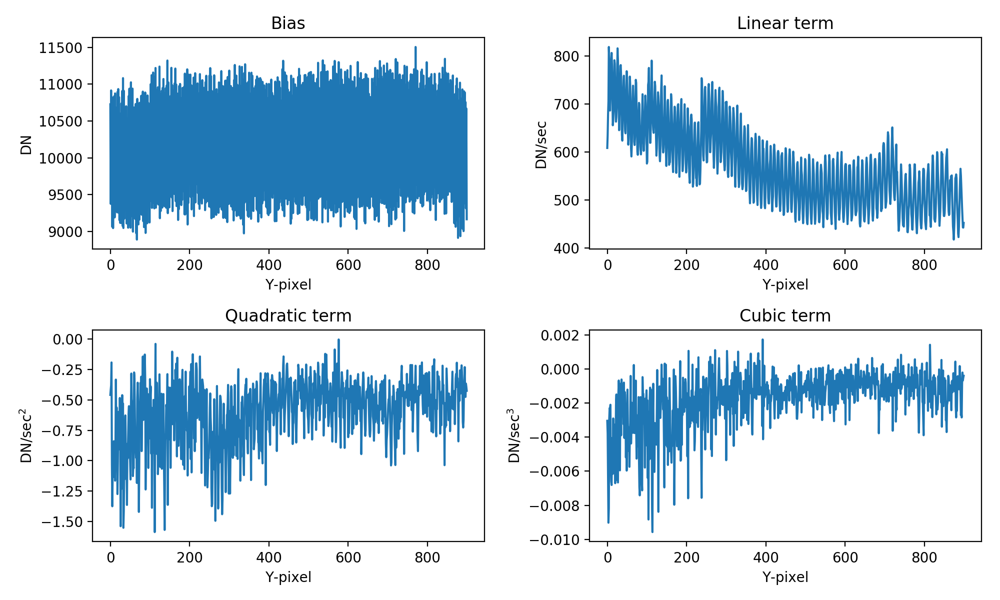

<IPython.core.display.Javascript object>


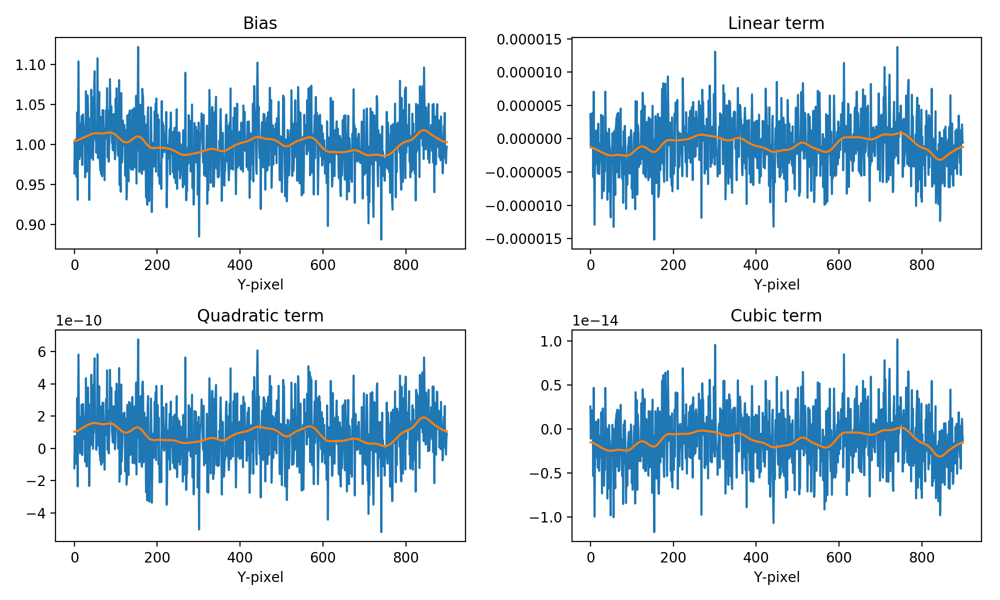

<IPython.core.display.Javascript object>


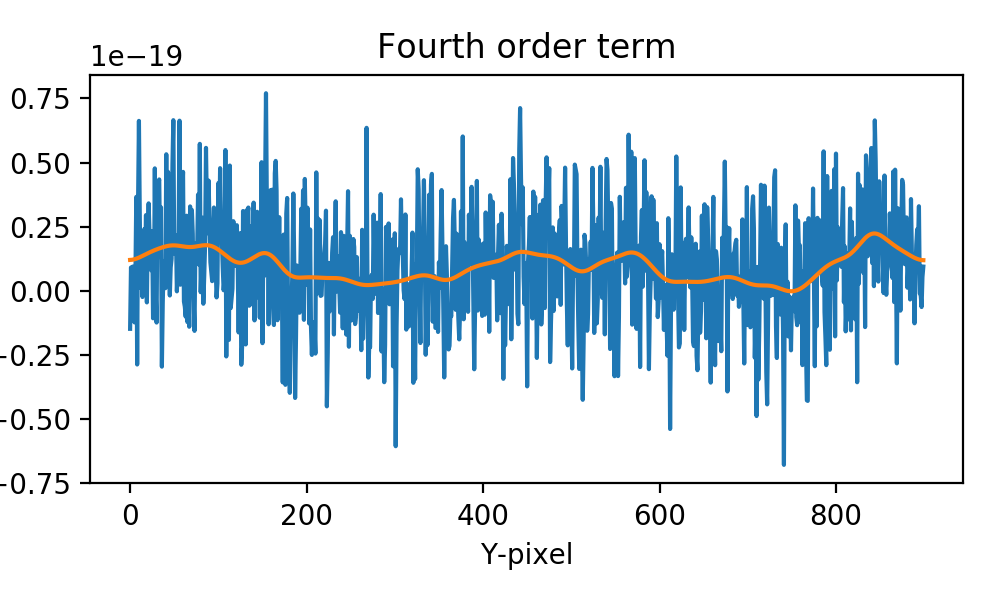

In [18]:
plt.close('all')

trace_y,trace_x = trace_y[50:950],trace_x[50:950]

fig,axs = plt.subplots(2,2,figsize=(10,6))
axs[0,0].plot(bias_map[trace_y,trace_x])
axs[0,0].set_ylabel('DN')
axs[0,0].set_title('Bias')
axs[0,1].plot(linear_term_map[trace_y,trace_x])
axs[0,1].set_ylabel('DN/sec')
axs[0,1].set_title('Linear term')
axs[1,0].plot(quad_term_map[trace_y,trace_x])
axs[1,0].set_ylabel(r'DN/sec$^2$')
axs[1,0].set_title('Quadratic term')
axs[1,1].plot(cubic_term_map[trace_y,trace_x])
axs[1,1].set_ylabel(r'DN/sec$^3$')
axs[1,1].set_title('Cubic term')
for i,j in itertools.product(range(2),range(2)):
    axs[i,j].set_xlabel(r'Y-pixel')
plt.tight_layout()

sigma_smooth = 15
fig,axs = plt.subplots(2,2,figsize=(10,6))
axs[0,0].plot(out_parameters[0,trace_y,trace_x])
axs[0,0].plot(gaussian_filter1d(out_parameters[0,trace_y,trace_x],sigma_smooth))
axs[0,0].set_title('Bias')
axs[0,1].plot(out_parameters[1,trace_y,trace_x])
axs[0,1].plot(gaussian_filter1d(out_parameters[1,trace_y,trace_x],sigma_smooth))
axs[0,1].set_title('Linear term')
axs[1,0].plot(out_parameters[2,trace_y,trace_x])
axs[1,0].plot(gaussian_filter1d(out_parameters[2,trace_y,trace_x],sigma_smooth))
axs[1,0].set_title('Quadratic term')
axs[1,1].plot(out_parameters[3,trace_y,trace_x])
axs[1,1].plot(gaussian_filter1d(out_parameters[3,trace_y,trace_x],sigma_smooth))
axs[1,1].set_title('Cubic term')
for i,j in itertools.product(range(2),range(2)):
    axs[i,j].set_xlabel(r'Y-pixel')
plt.tight_layout()

plt.figure(figsize=(5,3))
plt.plot(out_parameters[4,trace_y,trace_x])
plt.plot(gaussian_filter1d(out_parameters[4,trace_y,trace_x],sigma_smooth))
plt.xlabel('Y-pixel')
plt.title('Fourth order term')
plt.tight_layout()

# Plot odd and even rows separately
# fig,axs = plt.subplots(2,2,figsize=(10,6))
# for i in range(1024):
#     if i%2 == 0:
#         color = 'k'
#     else:
#         color = 'r'
#     axs[0,0].plot(i,out_parameters[0,trace_y[i],trace_x[i]],color+'o')
#     axs[0,0].set_title('Bias')
#     axs[0,1].plot(i,out_parameters[1,trace_y[i],trace_x[i]],color+'o')
#     axs[0,1].set_title('Linear term')
#     axs[1,0].plot(i,out_parameters[2,trace_y[i],trace_x[i]],color+'o')
#     axs[1,0].set_title('Quadratic term')
#     axs[1,1].plot(i,out_parameters[3,trace_y[i],trace_x[i]],color+'o')
#     axs[1,1].set_title('Cubic term')
# for i,j in itertools.product(range(2),range(2)):
#     axs[i,j].set_xlabel(r'Y-pixel')
# plt.tight_layout()

## Derive non-linearity correction for full MRS detector

In [19]:
# initialize placeholders
bias_map,linear_term_map,quad_term_map,cubic_term_map = [np.zeros(shape =(image_shape[1], image_shape[2] ), dtype=np.float64) for i in range(4)]
out_parameters = np.zeros(shape =(order + 1, image_shape[1], image_shape[2] ), dtype=np.float64)
count_rate_at_0DN = np.zeros(shape =(image_shape[1], image_shape[2] ), dtype=np.float64)

for ypos,xpos in itertools.product(range(1024),range(6,512)):
    if (xpos==511) & (ypos%100 == 0):
        print 'Row {}'.format(ypos)
    try:
        time  = np.arange(1,nframes+1)[(analyze_ramp-1)*ngroups:analyze_ramp*ngroups]*frame_delta_time
        if analyze_ramp != 1:
            time = time-time[0]+frame_delta_time
        tramp = image_data[(analyze_ramp-1)*ngroups:analyze_ramp*ngroups,ypos,xpos]
        time2,tramp2 = time[skip_first:-skip_last],tramp[skip_first:-skip_last]
        time3,tramp3 = time2[tramp2 < 58000],tramp2[tramp2 < 58000]

        # derive non-linearity correction
        intime = time3
        inramp = tramp3

        num_samples = inramp.size
        first_fit_order = 3
        assert (num_samples > order + 3), 'Not enough samples for pixel (X,Y) = ({},{}) to derive a non-linearity correction'.format(xpos,ypos)

        bias,linear_term,quad_term,cubic_term = np.polynomial.polynomial.polyfit(intime, inramp, first_fit_order)

        expected_rate = linear_term
        expected_DN = bias+linear_term*intime

        # now get the ratio between the expected DN and the actual DN. 
        # This is the correction factor.
        correction_factor = expected_DN/inramp
        assert np.sum(np.isfinite(correction_factor)) == correction_factor.size, 'There are non legal values in the correction factor array'

        #solve for the correction factor as a function of observed DN.
        coefs = np.polynomial.polynomial.polyfit(inramp, correction_factor, order)

        # insert results in placeholder array
        bias_map[ypos,xpos],linear_term_map[ypos,xpos],quad_term_map[ypos,xpos],cubic_term_map[ypos,xpos] = bias,linear_term,quad_term,cubic_term
        out_parameters[:, ypos,xpos] = coefs
        count_rate_at_0DN[ypos,xpos] = expected_rate
    except:
        pass

Row 0
Row 100
Row 200
Row 300
Row 400
Row 500
Row 600
Row 700
Row 800
Row 900
Row 1000


<IPython.core.display.Javascript object>


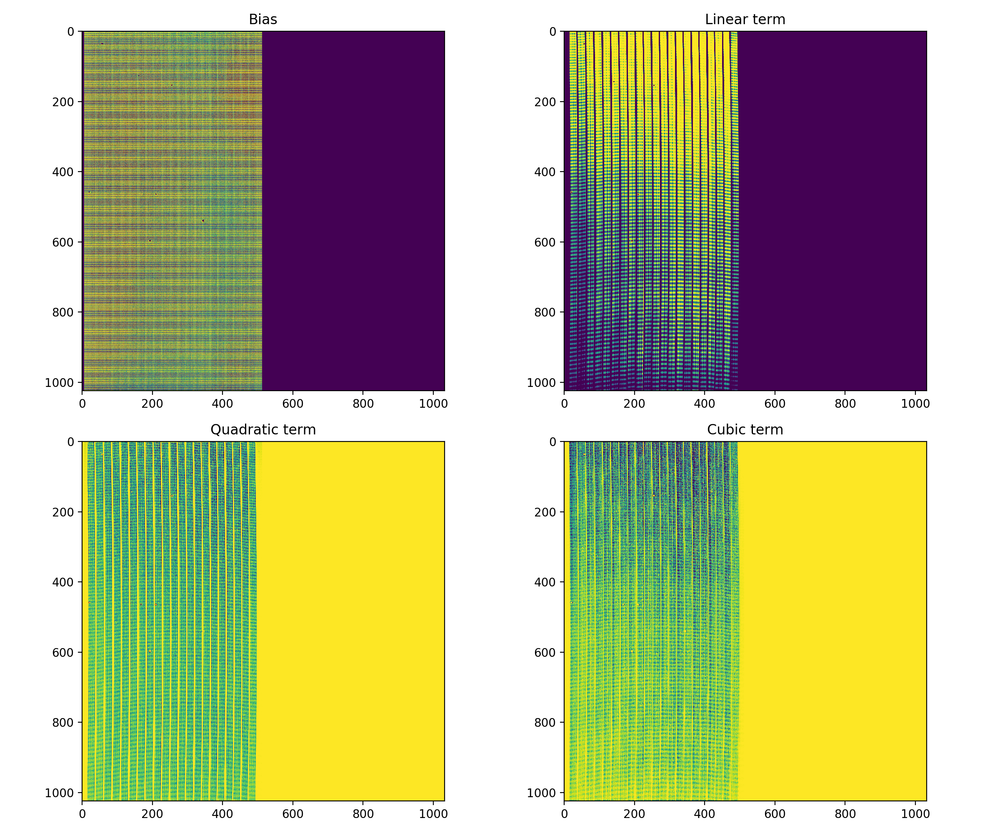

In [20]:
plt.close('all')
fig,axs = plt.subplots(2,2,figsize=(12,10))
axs[0,0].imshow(bias_map,vmin=9000,vmax=11000)
axs[0,0].set_title('Bias')
axs[0,1].imshow(linear_term_map,vmin=500,vmax=700)
axs[0,1].set_title('Linear term')
axs[1,0].imshow(quad_term_map,vmin=-2,vmax=0)
axs[1,0].set_title('Quadratic term')
axs[1,1].imshow(cubic_term_map,vmin=-0.01,vmax=0.)
axs[1,1].set_title('Cubic term')
plt.tight_layout()

# Quadratic term shows imprint of fringes; this is most likely due to the DN dependence of the non-linearity. 
# On a fringe peak the DN are higher thus the non-linearity is more severe and the ramp is more bent (and vice-versa for a fringe peak trough).

In [23]:
reduced_bias_map = out_parameters[0, :,:].copy()
reduced_bias_map[d2cMaps['sliceMap'] == 0] = 0

reduced_linear_term_map = out_parameters[1, :,:].copy()
reduced_linear_term_map[d2cMaps['sliceMap'] == 0] = 0

reduced_quadratic_term_map = out_parameters[2, :,:].copy()
reduced_quadratic_term_map[d2cMaps['sliceMap'] == 0] = 0

reduced_cubic_term_map = out_parameters[3, :,:].copy()
reduced_cubic_term_map[d2cMaps['sliceMap'] == 0] = 0

reduced_fourth_order_map = out_parameters[4, :,:].copy()
reduced_fourth_order_map[d2cMaps['sliceMap'] == 0] = 0

<IPython.core.display.Javascript object>


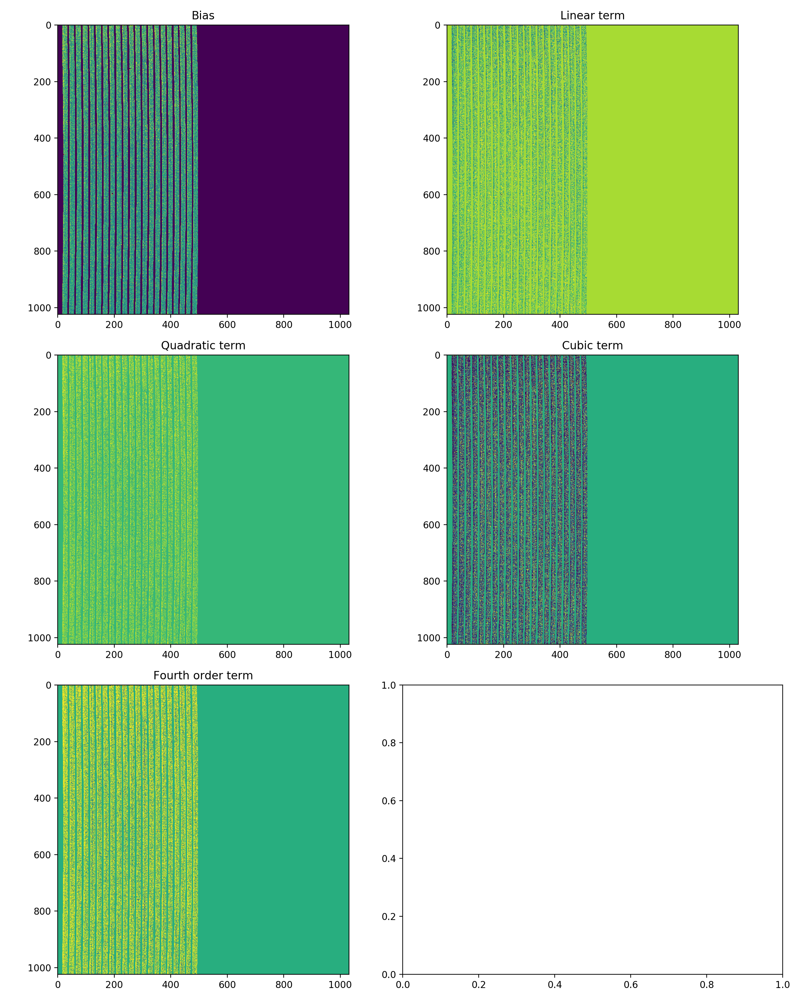

In [25]:
plt.close('all')
fig,axs = plt.subplots(3,2,figsize=(12,15))
axs[0,0].imshow(reduced_bias_map,vmin=0.9,vmax=1.1)
axs[0,0].set_title('Bias')
axs[0,1].imshow(reduced_linear_term_map*1e6,vmin=-20,vmax=3)
axs[0,1].set_title('Linear term')
axs[1,0].imshow(reduced_quadratic_term_map*1e10,vmin=-10,vmax=5)
axs[1,0].set_title('Quadratic term')
axs[1,1].imshow(reduced_cubic_term_map*1e15,vmin=-5,vmax=3)
axs[1,1].set_title('Cubic term')
axs[2,0].imshow(reduced_fourth_order_map*1e20,vmin=-5,vmax=3)
axs[2,0].set_title('Fourth order term')
plt.tight_layout()

In [28]:
out_parameters = np.zeros(shape =(order + 1, image_shape[1], image_shape[2] ), dtype=np.float64)
out_parameters[0,:,:] = reduced_bias_map
out_parameters[1,:,:] = reduced_linear_term_map
out_parameters[2,:,:] = reduced_quadratic_term_map
out_parameters[3,:,:] = reduced_cubic_term_map
out_parameters[4,:,:] = reduced_fourth_order_map

In [128]:
outfile = 'NonLinearityCorrection_OutputParameters_CV3_MRS_RAD_14_Band{}'.format(band)
np.save(outfile, out_parameters)

In [ ]:
out_parameters = np.load(outfile)

In [30]:
out_parameters_dic = {}
out_parameters_dic[band] = out_parameters

<IPython.core.display.Javascript object>


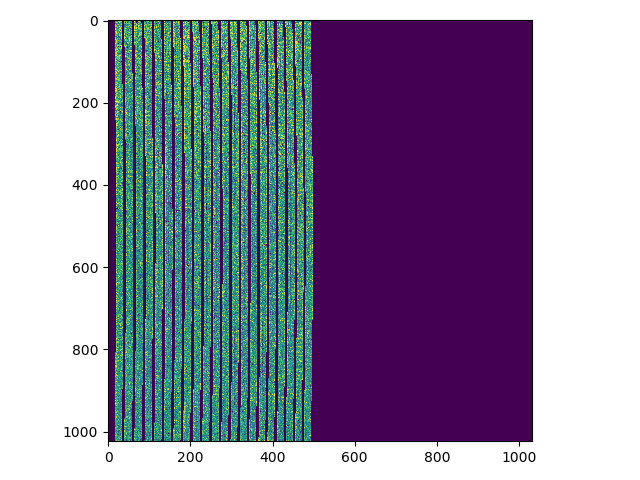

In [91]:
plt.figure()
plt.imshow(out_parameters[0,:,:],vmin=0.9,vmax=1.1)
plt.tight_layout()

### 2D polynomial fit for one slice at a time

<IPython.core.display.Javascript object>


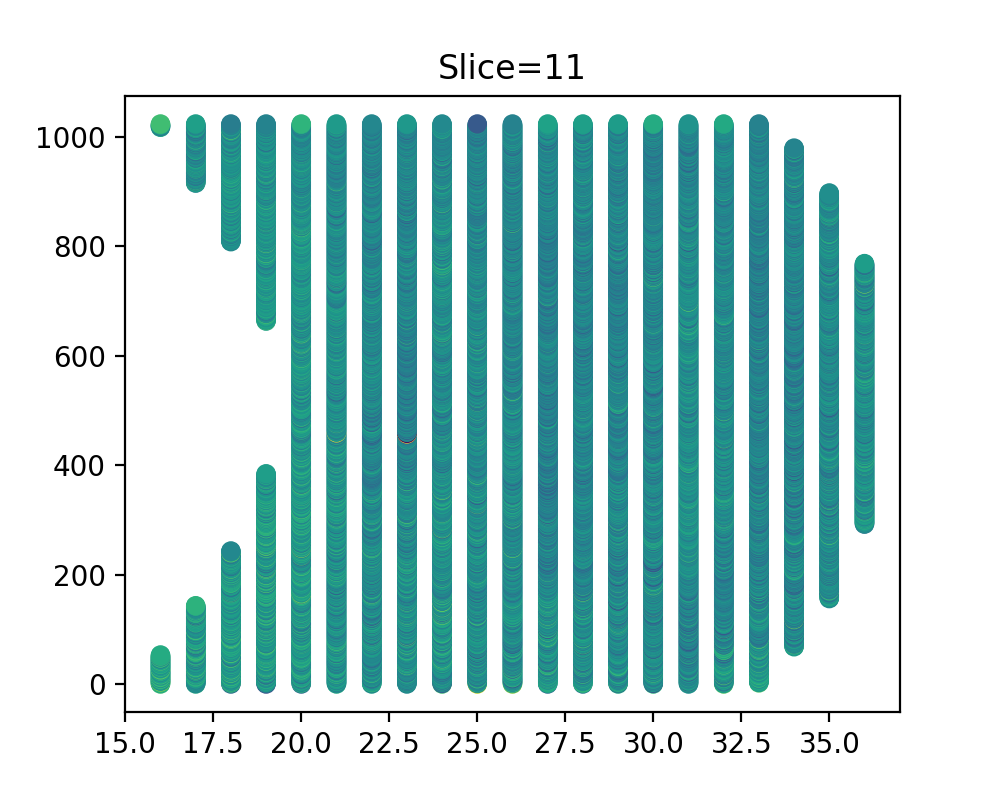

<IPython.core.display.Javascript object>


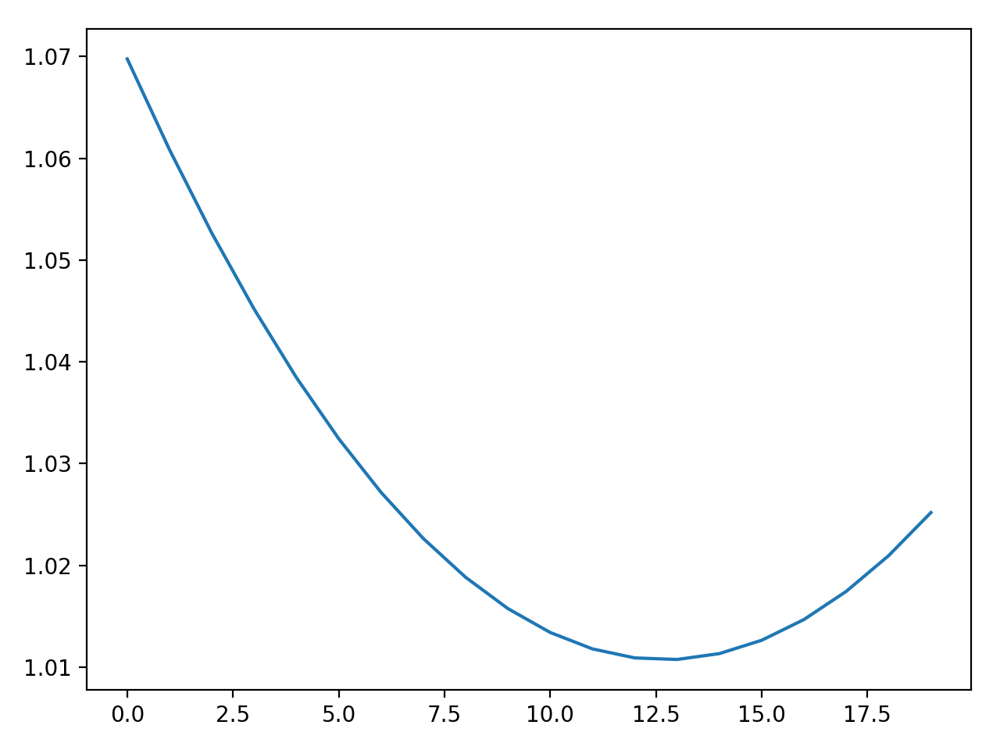

<IPython.core.display.Javascript object>


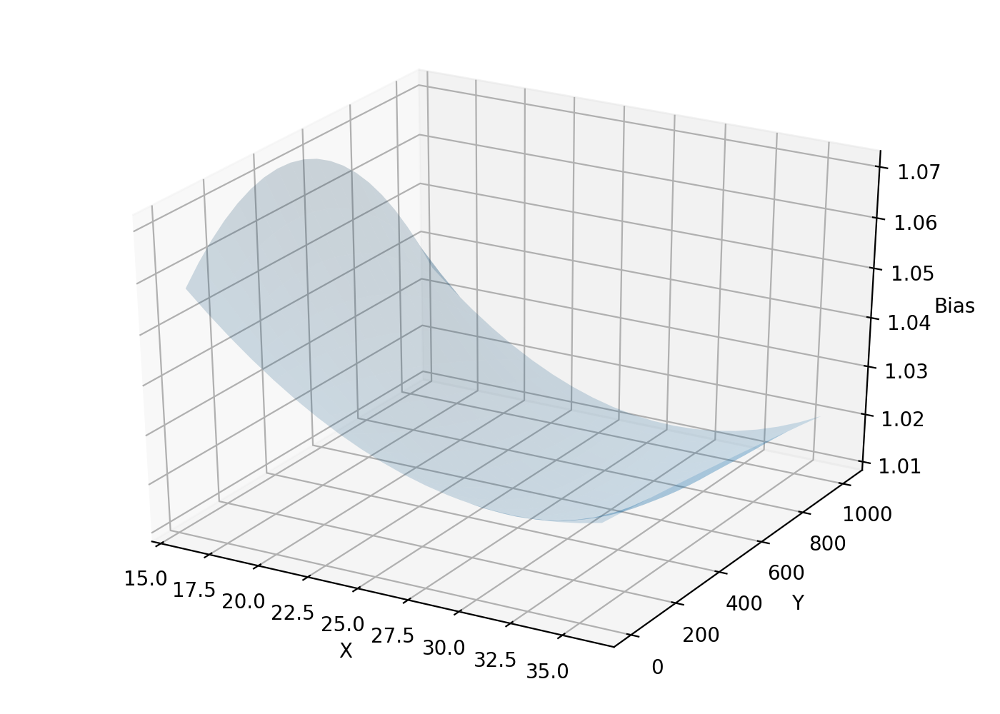

In [90]:
plot = True
plt.close('all')
# Data for 2D polynomial fit:
islice = 11
y,x = np.where(d2cMaps['sliceMap'] == 100*int(band[0])+islice )
z = out_parameters[0,:,:][(d2cMaps['sliceMap'] == 100*int(band[0])+islice)]

z[(z<0.5)] = 1
z[(z>1.5)] = 1

# Fit 2d polynomial to data
# compute slice reference x-position
alpha_img = np.zeros(out_parameters[0,:,:].shape)
alpha_img[(d2cMaps['sliceMap'] == 100*int(band[0])+islice)] = d2cMaps['alphaMap'][(d2cMaps['sliceMap'] == 100*int(band[0])+islice)]
x_coords = np.nonzero(alpha_img[512,:])[0]
alphas = alpha_img[512,:][x_coords]
x_s = interp1d(alphas,x_coords)(0.)
try:
    m = funcs.polyfit2d(x_s,x,y,z,2)
except ValueError:
    raise ValueError, "FIT CRASHES FOR SLICE=" + str(islice)

if len(m) == 9:
    # 2D polynomial fit of order 2
    m = funcs.convert_m_order2_to_order4(m)

if plot:
    # Evaluate the 2D polynomial fit on a regular grid...
    nx, ny = 20, 20
    xx, yy = np.meshgrid(np.linspace(x.min(), x.max(), nx),
                         np.linspace(y.min(), y.max(), ny))
    zz = funcs.polyval2d(x_s,xx, yy, m)
    
   # Plot trace and isolambda
    plt.figure(figsize=(5,4))
    plt.title("Slice="+str(islice))
    plt.scatter(x,y, c=z)
    plt.show()
    
    plt.figure()
    plt.plot(zz[zz.shape[0]/2])
    plt.tight_layout()

    fig = plt.figure(figsize=(7,5))
    ax = fig.gca(projection='3d')
    ax.plot_surface(xx, yy, zz, rstride=1, cstride=1, alpha=0.2)
#     ax.scatter(x,y, z,c=z)
    plt.xlabel('X')
    plt.ylabel('Y')
    ax.set_zlabel('Bias')
    ax.axis('equal')
    ax.axis('tight')
    plt.tight_layout()

In [ ]:
channel = int(band[0])
new_biasMap  = np.zeros(d2cMaps['sliceMap'].shape)

for islice in [11]:# range(1,nslices+1):
    # load new wavelength solution
    slice_wavcoeffs = m # np.loadtxt(wavsolution_file,unpack=True,skiprows = 5)
    
    # create placeholder and identify pixels in slice
    pixelCtry,pixelCtrx = np.where(d2cMaps['sliceMap'] == int(islice+100*channel))
    
    # apply the 2D polynomial transform
    lp = slice_wavcoeffs
    # compute slice reference x-position
    alpha_img = np.zeros((1024,1032))
    alpha_img[(d2cMaps['sliceMap'] == 100*int(band[0])+islice)] = d2cMaps['alphaMap'][(d2cMaps['sliceMap'] == 100*int(band[0])+islice)]
    x_coords = np.nonzero(alpha_img[512,:])[0]
    alphas = alpha_img[512,:][x_coords]
    xs = interp1d(alphas,x_coords)(0.)
    
    new_biasMap[pixelCtry,pixelCtrx]   = funcs.polyval2d(xs,pixelCtrx, pixelCtry, lp)

### Single 2D polynomial fit for all slices at once

<IPython.core.display.Javascript object>


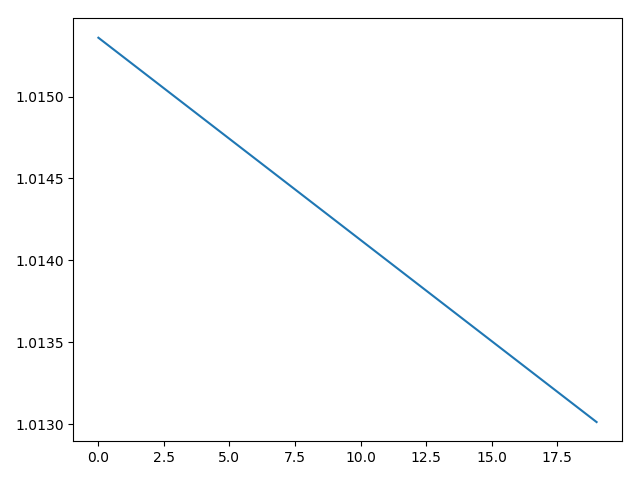

<IPython.core.display.Javascript object>


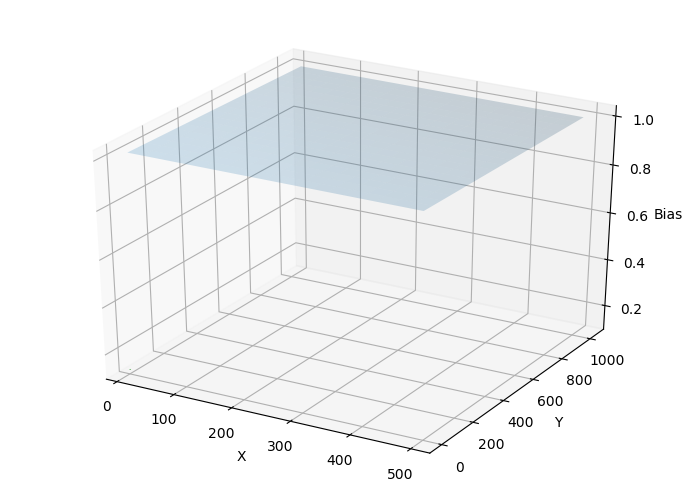

In [115]:
plot = True
plt.close('all')
# Data for 2D polynomial fit:
# islice = 11
sel = (d2cMaps['sliceMap'] > 100*int(band[0])) & (d2cMaps['sliceMap'] < 100*(int(band[0])+1) )
y,x = np.where(sel)
z = out_parameters[0,:,:][sel]

z[(z<0.5)] = 1
z[(z>1.5)] = 1

# Fit 2d polynomial to data
x_s = 512/2
try:
    m = funcs.polyfit2d(x_s,x,y,z,1)
except ValueError:
    raise ValueError, "FIT CRASHES FOR SLICE=" + str(islice)

if len(m) == 9:
    # 2D polynomial fit of order 2
    m = funcs.convert_m_order2_to_order4(m)

if plot:
    # Evaluate the 2D polynomial fit on a regular grid...
    nx, ny = 20, 20
    xx, yy = np.meshgrid(np.linspace(x.min(), x.max(), nx),
                         np.linspace(y.min(), y.max(), ny))
    zz = funcs.polyval2d(x_s,xx, yy, m)
    
    plt.figure()
    plt.plot(zz[zz.shape[0]/2])
    plt.tight_layout()

    fig = plt.figure(figsize=(7,5))
    ax = fig.gca(projection='3d')
    ax.plot_surface(xx, yy, zz, rstride=1, cstride=1, alpha=0.2)
#     ax.scatter(x,y, z,c=z)
    plt.xlabel('X')
    plt.ylabel('Y')
    ax.set_zlabel('Bias')
    ax.axis('equal')
    ax.axis('tight')
    plt.tight_layout()

In [95]:
print m

[ 1.02160831e+00 -4.76156429e-06 -1.37851728e-05 -2.31550234e-10]


In [111]:
channel = int(band[0])
new_biasMap  = np.zeros(d2cMaps['sliceMap'].shape)

# create placeholder and identify pixels in slice
x,y = np.arange(512),np.arange(1024)
pixelCtrx,pixelCtry = np.meshgrid(x,y)# np.where(sel)

# apply the 2D polynomial transform
nlp = m
new_biasMap[pixelCtry,pixelCtrx]   = funcs.polyval2d(x_s,pixelCtrx, pixelCtry, nlp)

<IPython.core.display.Javascript object>


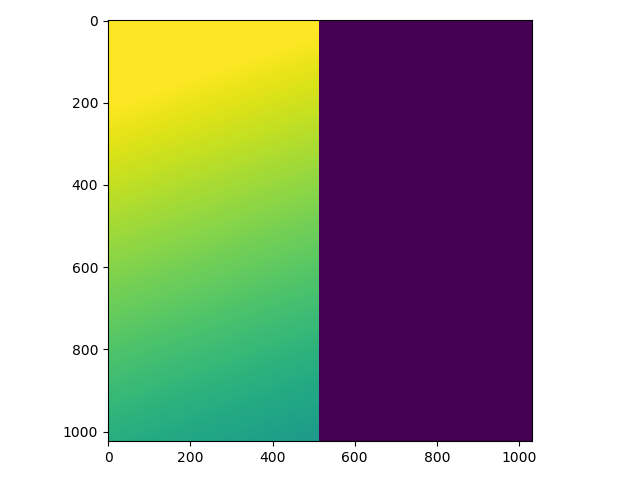

In [113]:
plt.figure()
plt.imshow(new_biasMap,vmin=0.99,vmax=1.02)
plt.tight_layout()

### Compute residuals

<IPython.core.display.Javascript object>


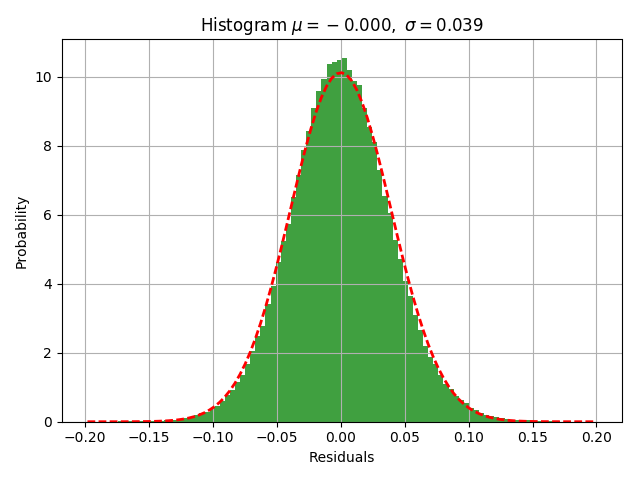

In [127]:
from scipy.stats import norm
import matplotlib.mlab as mlab
residuals = out_parameters[0,:,:][sel]-new_biasMap[sel]
sel = (residuals>=-0.2) & (residuals<=0.2)

(mu, sigma) = norm.fit(residuals[sel])
plt.figure()
n, bins, patches = plt.hist(residuals[sel], 100, normed=1, facecolor='green', alpha=0.75)
y = mlab.normpdf(bins, mu, sigma)
plt.plot(bins, y, 'r--', linewidth=2)
plt.xlabel('Residuals')
plt.ylabel('Probability')
plt.title(r'$\mathrm{Histogram:}\ \mu=%.3f,\ \sigma=%.3f$' %(mu, sigma))
plt.grid(True)
plt.tight_layout()

# Multi-band analysis

In [24]:
out_parameters_dic = {}

for band in ['1A','1B','1C','2A','2B','2C','3A','3B','3C','4A','4B','4C']:
    print 'Band {}'.format(band)
#     # CV3 MIRM33541 (MRS_RAD_11, observations of internal calibration source in nominal and cross-dichroic configurations)
#     filename = mrsobs.MIRI_internal_calibration_source(lvl1path,band,campaign='CV3',output='filename').replace('_LVL2','')
    # CV3 MIRM108 (MRS_RAD_14, ramps purposed for non-linearity correction)
    filename = mrsobs.MIRI_internal_calibration_source_nonlinearity_correction(lvl1path,band,output='filename').replace('_LVL2','')
    
    image_hdu = fits.open(filename)
    image_data = fits.getdata(filename)[:,:1024,:].astype('float')

    #
    image_shape = image_data.shape
    nints       = image_hdu[0].header['NINT']
    ngroups     = image_hdu[0].header['NGROUP']
    nframes     = image_shape[0]
    frame_delta_time = image_hdu[0].header['TFRAME']

    # initialize placeholders
    bias_map,linear_term_map,quad_term_map,cubic_term_map = [np.zeros(shape =(image_shape[1], image_shape[2] ), dtype=np.float64) for i in range(4)]
    out_parameters = np.zeros(shape =(order + 1, image_shape[1], image_shape[2] ), dtype=np.float64)

    d2cMaps   = funcs.load_obj('d2cMaps_band{}_tr90pc'.format(band),path=d2cMapDir)
    trace_y,trace_x = funcs.detpixel_trace(band,d2cMaps,sliceID=d2cMaps['nslices']/2,alpha_pos=0.)
    for i in range(1024):
        ypos,xpos = trace_y[i],trace_x[i]
        time  = np.arange(1,nframes+1)[(analyze_ramp-1)*ngroups:analyze_ramp*ngroups]*frame_delta_time
        tramp = image_data[(analyze_ramp-1)*ngroups:analyze_ramp*ngroups,ypos,xpos]
        time2,tramp2 = time[skip_first:-skip_last],tramp[skip_first:-skip_last]
        time3,tramp3 = time2[tramp2 < 58000],tramp2[tramp2 < 58000]

        # derive non-linearity correction
        intime = time3
        inramp = tramp3

        num_samples = inramp.size
        first_fit_order = 3
        if num_samples <= order + 3:
            continue

        bias,linear_term,quad_term,cubic_term = np.polynomial.polynomial.polyfit(intime, inramp, first_fit_order)

        expected_rate = linear_term
        expected_DN = expected_rate * (intime-intime[0]) + inramp[0]

        # now get the ratio between the expected DN and the actual DN. 
        # This is the correction factor.
        correction_factor = expected_DN/inramp
        assert np.sum(np.isfinite(correction_factor)) == correction_factor.size, 'There are non legal values in the correction factor array'

        #solve for the correction factor as a function of observed DN.
        coefs = np.polynomial.polynomial.polyfit(inramp, correction_factor, order)

        # insert results in placeholder array
        bias_map[ypos,xpos],linear_term_map[ypos,xpos],quad_term_map[ypos,xpos],cubic_term_map[ypos,xpos] = bias,linear_term,quad_term,cubic_term
        out_parameters[:, ypos,xpos] = coefs

    out_parameters_dic[band] = out_parameters

Band 1A
Band 1B
Band 1C
Band 2A
Band 2B
Band 2C
Band 3A
Band 3B
Band 3C
Band 4A
Band 4B
Band 4C


<IPython.core.display.Javascript object>


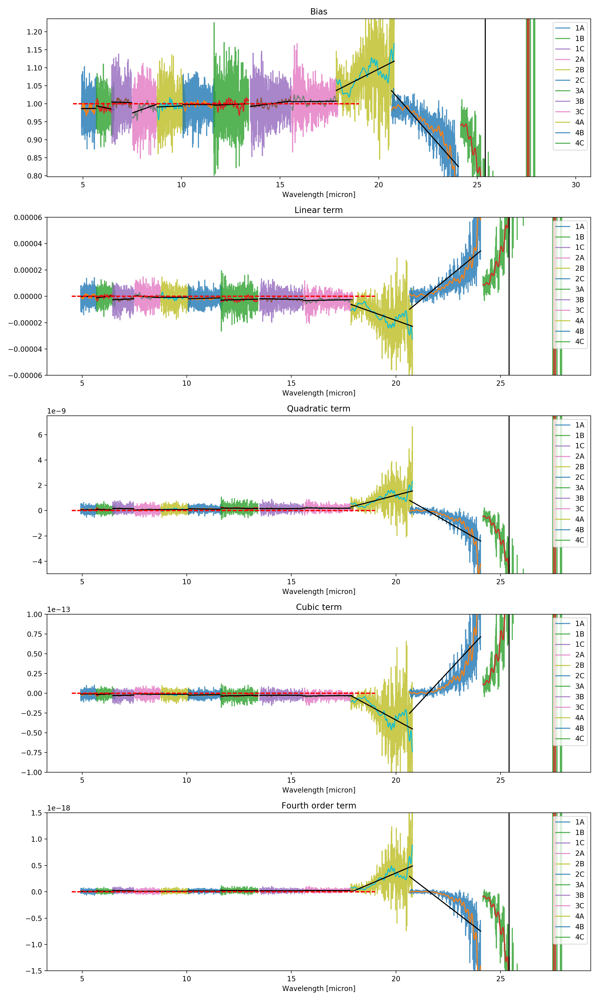

In [26]:
plt.close('all')
# Use band 1A values as reference
d2cMaps = funcs.load_obj('d2cMaps_band{}_tr90pc'.format('1A'),path=d2cMapDir)

fig,axs = plt.subplots(5,1,figsize=(12,20))
bands = ['1A','1B','1C','2A','2B','2C','3A','3B','3C','4A','4B','4C']
for i,band in enumerate(bands):
    xaxis   = i*len(np.arange(1024)[50:950])+np.arange(1024)[50:950]
    d2cMaps = funcs.load_obj('d2cMaps_band{}_tr90pc'.format(band),path=d2cMapDir)
    trace_y,trace_x = funcs.detpixel_trace(band,d2cMaps,sliceID=d2cMaps['nslices']/2,alpha_pos=0.)
    
    trace_y,trace_x = trace_y[50:950],trace_x[50:950]
    
    first_order_fit_bias = np.poly1d(np.polyfit(d2cMaps['lambdaMap'][trace_y,trace_x],out_parameters_dic[band][0,trace_y,trace_x],1))(d2cMaps['lambdaMap'][trace_y,trace_x])
    first_order_fit_linear = np.poly1d(np.polyfit(d2cMaps['lambdaMap'][trace_y,trace_x],out_parameters_dic[band][1,trace_y,trace_x],1))(d2cMaps['lambdaMap'][trace_y,trace_x])
    first_order_fit_quad = np.poly1d(np.polyfit(d2cMaps['lambdaMap'][trace_y,trace_x],out_parameters_dic[band][2,trace_y,trace_x],1))(d2cMaps['lambdaMap'][trace_y,trace_x])
    first_order_fit_cubic = np.poly1d(np.polyfit(d2cMaps['lambdaMap'][trace_y,trace_x],out_parameters_dic[band][3,trace_y,trace_x],1))(d2cMaps['lambdaMap'][trace_y,trace_x])
    first_order_fit_fourth = np.poly1d(np.polyfit(d2cMaps['lambdaMap'][trace_y,trace_x],out_parameters_dic[band][4,trace_y,trace_x],1))(d2cMaps['lambdaMap'][trace_y,trace_x])
    
    sigma_smooth = 10
    axs[0].plot(d2cMaps['lambdaMap'][trace_y,trace_x],out_parameters_dic[band][0,trace_y,trace_x],alpha=0.8,zorder=0,label=band)
    axs[0].plot(d2cMaps['lambdaMap'][trace_y,trace_x],gaussian_filter1d(out_parameters_dic[band][0,trace_y,trace_x],sigma_smooth),zorder=0)
    axs[0].plot(d2cMaps['lambdaMap'][trace_y,trace_x],first_order_fit_bias,'k',zorder=0)
    axs[0].set_ylim(0.5,1.6)
    axs[0].hlines(1,4.5,19,'r',linestyle='dashed',zorder=1)
#     axs[0].hlines(np.mean(out_parameters_dic[band][0,trace_y,trace_x]),xaxis[0],xaxis[-1],'k',linestyle='dashed',zorder=1)
    axs[0].set_title('Bias')
    axs[1].plot(d2cMaps['lambdaMap'][trace_y,trace_x],out_parameters_dic[band][1,trace_y,trace_x],alpha=0.8,zorder=0,label=band)
    axs[1].plot(d2cMaps['lambdaMap'][trace_y,trace_x],gaussian_filter1d(out_parameters_dic[band][1,trace_y,trace_x],sigma_smooth),zorder=0)
#     axs[1].hlines(np.mean(out_parameters_dic[band][1,trace_y,trace_x]),xaxis[0],xaxis[-1],'k',linestyle='dashed',zorder=1)
    axs[1].hlines(0,4.5,19,'r',linestyle='dashed',zorder=1)
    axs[1].plot(d2cMaps['lambdaMap'][trace_y,trace_x],first_order_fit_linear,'k',zorder=0)
    axs[1].set_ylim(-0.00006,0.00006)
    axs[1].set_title('Linear term')
    axs[2].plot(d2cMaps['lambdaMap'][trace_y,trace_x],out_parameters_dic[band][2,trace_y,trace_x],alpha=0.8,zorder=0,label=band)
    axs[2].plot(d2cMaps['lambdaMap'][trace_y,trace_x],gaussian_filter1d(out_parameters_dic[band][2,trace_y,trace_x],sigma_smooth),zorder=0)
#     axs[2].hlines(np.mean(out_parameters_dic[band][2,trace_y,trace_x]),xaxis[0],xaxis[-1],'k',linestyle='dashed',zorder=1)
    axs[2].hlines(0,4.5,19,'r',linestyle='dashed',zorder=1)
    axs[2].plot(d2cMaps['lambdaMap'][trace_y,trace_x],first_order_fit_quad,'k',zorder=0)
    axs[2].set_ylim(-0.5*10**-8,0.75*10**-8)
    axs[2].set_title('Quadratic term')
    axs[3].plot(d2cMaps['lambdaMap'][trace_y,trace_x],out_parameters_dic[band][3,trace_y,trace_x],alpha=0.8,zorder=0,label=band)
    axs[3].plot(d2cMaps['lambdaMap'][trace_y,trace_x],gaussian_filter1d(out_parameters_dic[band][3,trace_y,trace_x],sigma_smooth),zorder=0)
#     axs[3].hlines(np.mean(out_parameters_dic[band][3,trace_y,trace_x]),xaxis[0],xaxis[-1],'k',linestyle='dashed',zorder=1)
    axs[3].hlines(0,4.5,19,'r',linestyle='dashed',zorder=1)
    axs[3].plot(d2cMaps['lambdaMap'][trace_y,trace_x],first_order_fit_cubic,'k',zorder=0)
    axs[3].set_ylim(-1e-13,1e-13)
    axs[3].set_title('Cubic term')
    axs[4].plot(d2cMaps['lambdaMap'][trace_y,trace_x],out_parameters_dic[band][4,trace_y,trace_x],alpha=0.8,zorder=0,label=band)
    axs[4].plot(d2cMaps['lambdaMap'][trace_y,trace_x],gaussian_filter1d(out_parameters_dic[band][4,trace_y,trace_x],sigma_smooth),zorder=0)
#     axs[4].hlines(np.mean(out_parameters_dic[band][4,trace_y,trace_x]),xaxis[0],xaxis[-1],'k',linestyle='dashed',zorder=1)
    axs[4].hlines(0,4.5,19,'r',linestyle='dashed',zorder=1)
    axs[4].plot(d2cMaps['lambdaMap'][trace_y,trace_x],first_order_fit_fourth,'k',zorder=0)
    axs[4].set_ylim(-1.5*10**-18,1.5*10**-18)
    axs[4].set_title('Fourth order term')
for plot in range(5):
    axs[plot].set_xlabel(r'Wavelength [micron]')
    axs[plot].legend()
plt.tight_layout()

In [27]:
VDDUC_dic,VDETCOM_dic,VSSOUT_dic,VBIAS_dic = {},{},{},{}

for band in ['1A','1B','1C','3A','3B','3C']:
    print 'Band {}'.format(band)
#     # CV3 MIRM33541 (MRS_RAD_11, observations of internal calibration source in nominal and cross-dichroic configurations)
#     filename = mrsobs.MIRI_internal_calibration_source(lvl1path,band,campaign='CV3',output='filename').replace('_LVL2','')
    # CV3 MIRM108 (MRS_RAD_14, ramps purposed for non-linearity correction)
    filename = mrsobs.MIRI_internal_calibration_source_nonlinearity_correction(lvl1path,band,output='filename').replace('_LVL2','')
    image_hdu = fits.open(filename)
    
    VDDUC,VDETCOM,VSSOUT = [],[],[]
    for i in range(len(image_hdu[1].data)):
        if image_hdu[1].data[i][1] in ['IGDP_MIR_SW_V_VDDUC','IGDP_MIR_LW_V_VDDUC']:
            VDDUC.append(float(image_hdu[1].data[i][2]))
        elif image_hdu[1].data[i][1] in ['IGDP_MIR_SW_V_VDETCOM','IGDP_MIR_LW_V_VDETCOM']:
            VDETCOM.append(float(image_hdu[1].data[i][2]))
        elif image_hdu[1].data[i][1] in ['IGDP_MIR_SW_V_VSSOUT','IGDP_MIR_LW_V_VSSOUT']:
            VSSOUT.append(float(image_hdu[1].data[i][2]))
    VDDUC,VDETCOM,VSSOUT = np.array(VDDUC),np.array(VDETCOM),np.array(VSSOUT)

    VBIAS = (VDDUC+0.2)-VDETCOM
    
    VDDUC_dic[band] = VDDUC
    VDETCOM_dic[band] = VDETCOM
    VSSOUT_dic[band] = VSSOUT
    VBIAS_dic[band] = VBIAS
# both detector halves have same bias voltage
for band in ['2A','2B','2C','4A','4B','4C']:
    VDDUC_dic[band]   = VDDUC_dic[str(int(band[0])-1)+band[1]]
    VDETCOM_dic[band] = VDETCOM_dic[str(int(band[0])-1)+band[1]]
    VSSOUT_dic[band]  = VSSOUT_dic[str(int(band[0])-1)+band[1]]
    VBIAS_dic[band]   = VBIAS_dic[str(int(band[0])-1)+band[1]]

Band 1A
Band 1B
Band 1C
Band 3A
Band 3B
Band 3C


<IPython.core.display.Javascript object>


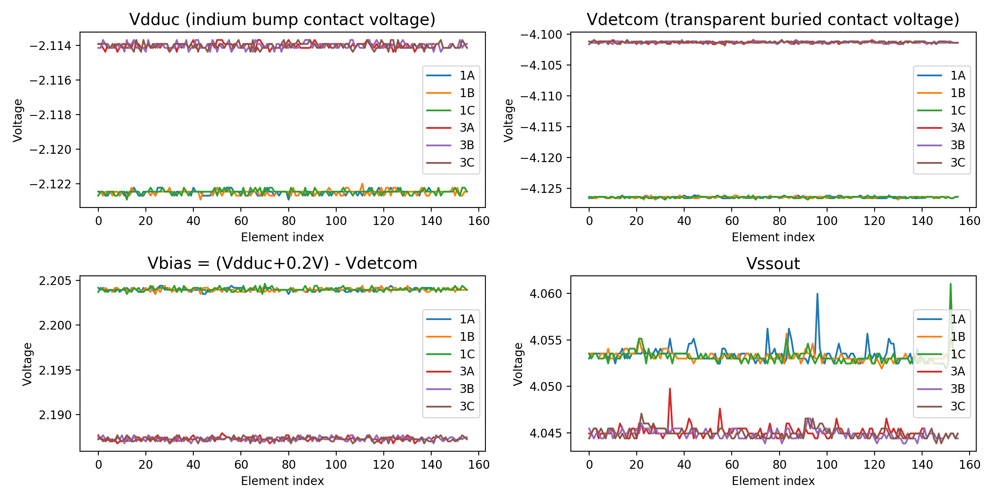

In [29]:
fig,axs = plt.subplots(2,2,figsize=(12,6))
for band in ['1A','1B','1C','3A','3B','3C']:
    axs[0,0].plot(VDDUC_dic[band],label=band)
    axs[0,1].plot(VDETCOM_dic[band],label=band)
    axs[1,0].plot(VBIAS_dic[band],label=band)
    axs[1,1].plot(VSSOUT_dic[band],label=band)
axs[0,0].set_title('Vdduc (indium bump contact voltage)',fontsize=14)
axs[0,1].set_title('Vdetcom (transparent buried contact voltage)',fontsize=14)
axs[1,0].set_title('Vbias = (Vdduc+0.2V) - Vdetcom',fontsize=14)
axs[1,1].set_title('Vssout',fontsize=14)
for i,j in itertools.product(range(2),range(2)):
    axs[i,j].set_xlabel('Element index')
    axs[i,j].set_ylabel('Voltage')
    axs[i,j].legend()
plt.tight_layout()

In [21]:
# compute median of normalized rates
normalized_rateDN = new_rate/count_rate_at_0DN
print normalized_rateDN.shape
normalized_rate = normalized_rateDN[:-1,:,:]
print normalized_rate.shape

saturation_level = 58000
norm_shape = normalized_rate[:-1,:,:].shape
med_normalized_rate = np.zeros(norm_shape[0], dtype=np.float64)
out_cube = np.zeros_like(normalized_rate)
for i in range(norm_shape[0]):
    normalized_plane = normalized_rate[i,:,:]
    normalized_plane[image_data[i,:,:] > 58000] = np.nan
    normalized_plane[count_rate_at_0DN < 600] = np.nan
    if np.sum(np.isfinite(normalized_plane)) > 10000:
        med_normalized_rate[i] = np.median(normalized_plane[np.isfinite(normalized_plane)])
# return med_normalized_rate[med_normalized_rate > 0]
# med_norm_rate_DN = find_med_normalized_rate(normalized_rateDN[:-1,:,:], calimage,countrateat0DN_DN)

(15, 1024, 1032)
(14, 1024, 1032)
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


/Users/ioannisa/anaconda2/envs/miricle.20170307/lib/python2.7/site-packages/ipykernel/__main__.py:2: RuntimeWarning: divide by zero encountered in divide
  from ipykernel import kernelapp as app
/Users/ioannisa/anaconda2/envs/miricle.20170307/lib/python2.7/site-packages/ipykernel/__main__.py:2: RuntimeWarning: invalid value encountered in divide
  from ipykernel import kernelapp as app


<IPython.core.display.Javascript object>


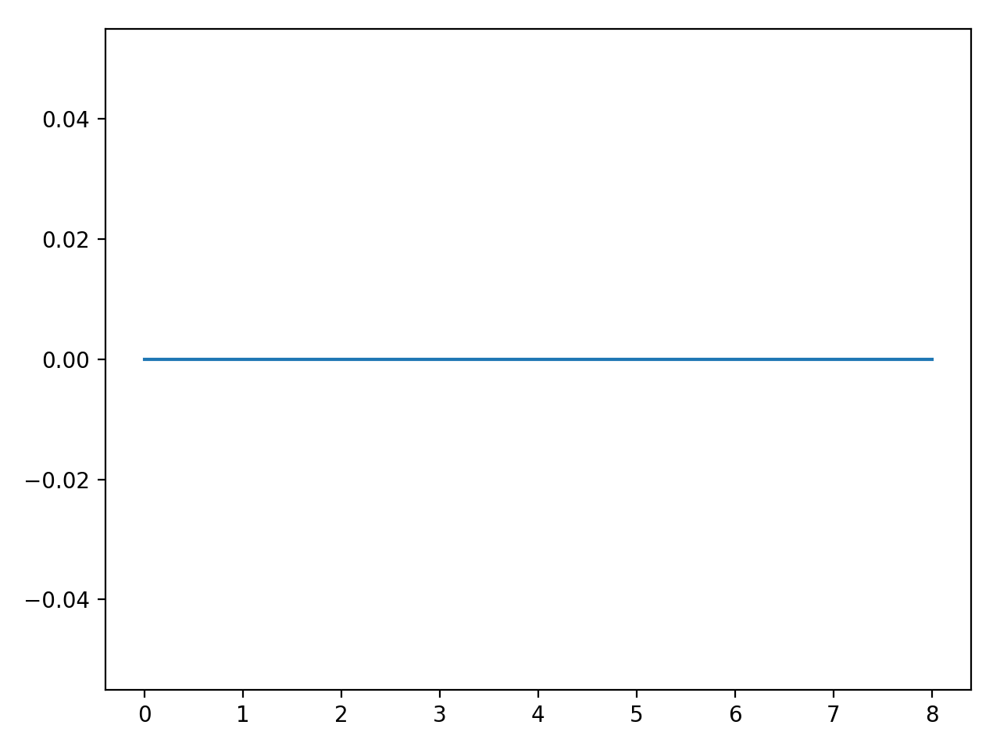

In [23]:
plt.figure()
plt.plot(med_normalized_rate[4:])
np.std(med_normalized_rate[4:])
plt.tight_layout()

<h2>Now try to correct the 2nd integration using the cal parameters from the 1st integration</h2>

In [13]:
correct_image1=fits.getdata('M105_00_000.fits')

In [15]:
cor_ramp_DN, cor_rate_DN = applynlimage(correct_image1, correct_ramp_DN ,outsolutionDN)

finished row  0
finished row  50
finished row  100
finished row  150
finished row  200
finished row  250
finished row  300
finished row  350
finished row  400
finished row  450
finished row  500
finished row  550
finished row  600
finished row  650
finished row  700
finished row  750
finished row  800
finished row  850
finished row  900
finished row  950
finished row  1000
finished row  1050
finished row  1100
finished row  1150
finished row  1200
finished row  1250


In [16]:
hdu = fits.PrimaryHDU(cor_ramp_DN)
hdu.writeto('corrampDN.fits', overwrite=True)
hdu = fits.PrimaryHDU(cor_rate_DN)
hdu.writeto('corrateDN.fits', overwrite=True)

/Users/mregan/anaconda3/envs/astroconda/lib/python3.5/site-packages/ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in true_divide
  """Entry point for launching an IPython kernel.
/Users/mregan/anaconda3/envs/astroconda/lib/python3.5/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in true_divide
  """Entry point for launching an IPython kernel.


0.0013456728600408855

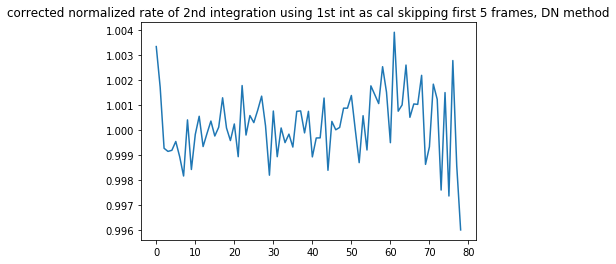

In [17]:
normalized_rate_corDN = cor_rate_DN/countrateat0DN_DN
hdu = fits.PrimaryHDU(normalized_rate_corDN)
hdu.writeto('normalizedratecorDN.fits',overwrite=True)
med_norm_rate_corDN = find_med_normalized_rate(normalized_rate_corDN[:-1,:,:], calimage,countrateat0DN_DN)
plt.plot(med_norm_rate_corDN[4:])
plt.title("corrected normalized rate of 2nd integration using 1st int as cal skipping first 5 frames, DN method")
np.std(med_norm_rate_corDN[4:])